In [459]:
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
%matplotlib inline

In [658]:
def camera_calibration():
    """
    Function uses chess board images to calculate 
    calibration coefficients and returns mtx, dist
    """
    objpoints = []
    imgpoints = []
    objp = np.zeros((6*9,3),np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    url = '../CarND-Advanced-Lane-Lines/camera_cal/'
    name = 'calibration*.jpg'

    images = glob.glob(url+name)

    if len(images)>0:
        for image in images:
            img = cv2.imread(image)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
            if ret == True:
                imgpoints.append(corners)
                objpoints.append(objp)

        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
        return mtx, dist
    else:
        return None, None
mtx, dist = camera_calibration()

In [659]:
def undist (img):
    """
    Function takes an image and mske distortion correction
    """
    return cv2.undistort(img, mtx, dist, None, mtx)
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    """
    Function takes an image, grayscale it, applies Sobel x or y, 
    then takes an absolute value and applies a threshold.
    """
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient!='x':
        sobel_x = 0
        sobel_y = 1
    else:
        sobel_x = 1
        sobel_y = 0
    sobel = cv2.Sobel(gray, cv2.CV_64F, sobel_x, sobel_y)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>thresh_min)&(scaled_sobel<=thresh_max)]=1
    # 6) Return this mask as your binary_output image
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """
    Function applies Sobel x and y, then computes the magnitude of the gradient
    and applies a threshold
    """    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelxy = (sobelx**2+sobely**2)**0.5
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobelxy = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobelxy)
    binary_output[(scaled_sobelxy>mag_thresh[0])&(scaled_sobelxy<mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    """
    Function applies Sobel x and y, then computes the direction of the gradient
    and applies a threshold.
    """ 
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction)
    binary_output[(direction>thresh[0])&(direction<thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def binary_and(binary1, binary2):
    """
    Function takes to binary images same shape and return their intersection
    """
    if binary1.shape == binary2.shape:
        binary = np.where(np.logical_and(binary1,binary2)==True, 1., 0.)
        return binary
    else:
        return None

def binary_or(binary1, binary2):
    """
    Function takes to binary images same shape and return their union
    """
    if binary1.shape == binary2.shape:
        binary = np.where(np.logical_or(binary1,binary2)==True, 1., 0.)
        return binary
    else:
        return None

def binary_xor(binary1, binary2):
    """
    Function takes to binary images same shape and return their union
    """
    if binary1.shape == binary2.shape:
        binary = np.where(np.logical_xor(binary1,binary2)==True, 1., 0.)
        return binary
    else:
        return None
    
def ch_threshold(img, ch=0, thresh=(0,180)):
    """
    Function takes an image (RGB, HSV, etc.),
    channel (0,1,2) for 3 channels, threshold
    and returns binary image of the thresholded channel 
    """
    if img.shape[2]>ch:
        CH = img[:,:,ch]
        binary = np.zeros_like(CH)
        binary [(CH>thresh[0])&(CH<=thresh[1])] = 1
        return binary
    else:
        return None
    
def show_2gr(img1,img2):
    """
    Function takes 2 images and plot them next to each other.
    """
    f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))
    ax1.imshow(img1, cmap='gray')
    ax2.imshow(img2, cmap='gray')

def warp(img):
    """
    Function takes an image and return an image with perspective transformation applied.
    Src points were taken on the images, provided by Udacity. Depends from the camera.
    Proportion is not saved: height ~22.5m, width ~7.4m
    """
    w,h = img.shape[1],img.shape[0] 
    img_size=(w,h)
    y = 0.8*h
    #x = 3.7/18*y
    x=0.5*w
    src = np.float32([[434./1280*w,562./720*h],
                      [589./1280*w,453./720*h],
                      [694./1280*w,453./720*h],
                      [864./1280*w,562./720*h]])
    dst = np.float32([[(w-x)/2.,0.9*h],
                      [(w-x)/2.,0.1*h],
                      [(w+x)/2.,0.1*h],
                      [(w+x)/2.,0.9*h]])
    M = cv2.getPerspectiveTransform(src,dst)
    img_warp = cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
    return img_warp

def unwarp(img):
    """
    Function takes warped image and returns unwarped image
    """
    w,h = img.shape[1],img.shape[0] 
    img_size=(w,h)
    y = 0.8*h
    #x = 3.7/18*y
    x=0.5*w
    dst = np.float32([[434./1280*w,562./720*h],
                      [589./1280*w,453./720*h],
                      [694./1280*w,453./720*h],
                      [864./1280*w,562./720*h]])
    src = np.float32([[(w-x)/2.,0.9*h],
                      [(w-x)/2.,0.1*h],
                      [(w+x)/2.,0.1*h],
                      [(w+x)/2.,0.9*h]])
    M = cv2.getPerspectiveTransform(src,dst)
    img_warp = cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
    return img_warp

def hist(img):
    """
    Function takes binary image and returns histogram: 
    sum of "1" pixel for each x on the bottom half of the image
    """
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    return histogram

Below I'm applying distortion correction to the image.
At the left is original image, at the right - corrected.

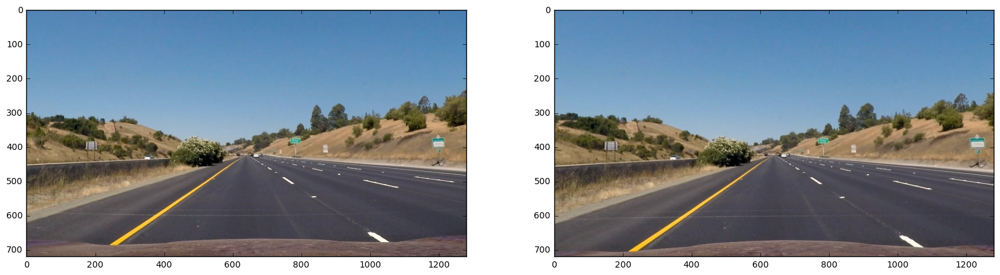

In [661]:
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/straight_lines1.jpg'
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
dst = undist(img)
f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))
ax1.imshow(img)
ax2.imshow(dst)

Below I'm going through the process of applying thresholds on different options of image gradient

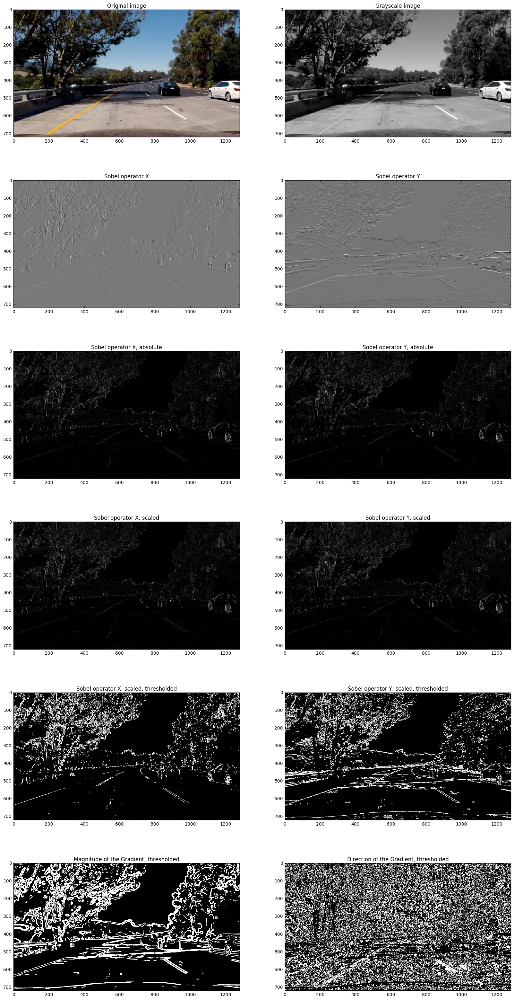

In [677]:
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/test5.jpg'
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
img = undist(img)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
abs_sobelx = np.absolute(sobelx)
abs_sobely = np.absolute(sobelx)
scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
sxbinary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
sybinary = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
mag_binary = mag_thresh(img, sobel_kernel=31, mag_thresh=(30, 100))
dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))

f, axarr = plt.subplots(6,2, figsize=(20,40))
axarr[0,0].imshow(img)
axarr[0,0].set_title('Original image')
axarr[0,1].imshow(gray,cmap='gray')
axarr[0,1].set_title('Grayscale image')
axarr[1,0].imshow(sobelx,cmap='gray')
axarr[1,0].set_title('Sobel operator X')
axarr[1,1].imshow(sobely,cmap='gray')
axarr[1,1].set_title('Sobel operator Y')
axarr[2,0].imshow(abs_sobelx,cmap='gray')
axarr[2,0].set_title('Sobel operator X, absolute')
axarr[2,1].imshow(abs_sobely,cmap='gray')
axarr[2,1].set_title('Sobel operator Y, absolute')
axarr[3,0].imshow(scaled_sobelx,cmap='gray')
axarr[3,0].set_title('Sobel operator X, scaled')
axarr[3,1].imshow(scaled_sobely,cmap='gray')
axarr[3,1].set_title('Sobel operator Y, scaled')
axarr[4,0].imshow(sxbinary,cmap='gray')
axarr[4,0].set_title('Sobel operator X, scaled, thresholded')
axarr[4,1].imshow(sybinary,cmap='gray')
axarr[4,1].set_title('Sobel operator Y, scaled, thresholded')
axarr[5,0].imshow(mag_binary,cmap='gray')
axarr[5,0].set_title('Magnitude of the Gradient, thresholded')
axarr[5,1].imshow(dir_binary,cmap='gray')
axarr[5,1].set_title('Direction of the Gradient, thresholded')

And some experiments of combining binary images with operations logical and, or, xor.

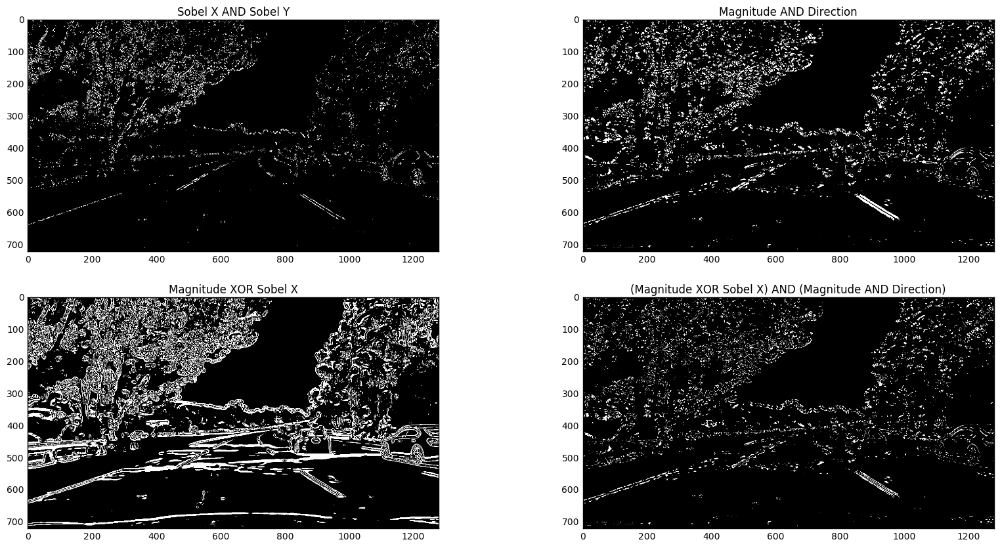

In [683]:
sx_sy = binary_and(sybinary, sxbinary)
mag_dir = binary_and(mag_binary, dir_binary)
mag_sx = binary_xor(mag_binary,sxbinary)
mag_sx_mag_dir = binary_and(mag_sx,mag_dir)

f, axarr = plt.subplots(2,2,figsize=(20,10))
axarr[0,0].imshow(sx_sy, cmap='gray')
axarr[0,0].set_title('Sobel X AND Sobel Y')
axarr[0,1].imshow(mag_dir, cmap='gray')
axarr[0,1].set_title('Magnitude AND Direction')
axarr[1,0].imshow(mag_sx, cmap='gray')
axarr[1,0].set_title('Magnitude XOR Sobel X')
axarr[1,1].imshow(mag_sx_mag_dir, cmap='gray')
axarr[1,1].set_title('(Magnitude XOR Sobel X) AND (Magnitude AND Direction)')

### HueLighteningSaturation cylindrical-coordinate representations of RGB image
Below I'm experimenting with channels of HLS image representation

Visualization of Saturation channel

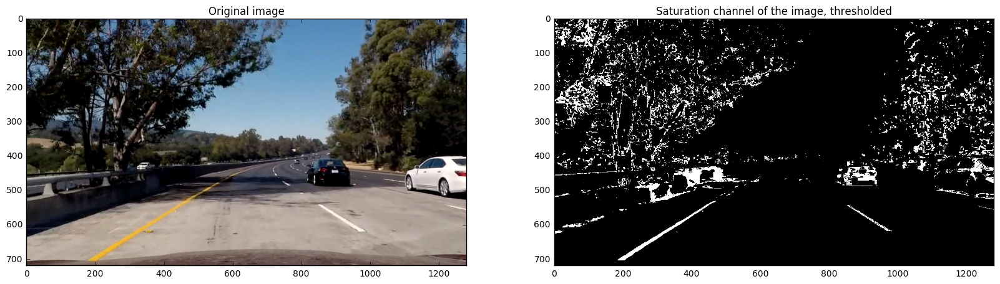

In [693]:
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
s_th = ch_threshold(hls, 2, thresh=(170,255))

f, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(img)
ax[0].set_title('Original image')
ax[1].imshow(s_th, cmap='gray')  
ax[1].set_title('Saturation channel of the image, thresholded')

Visualization of Hue channel

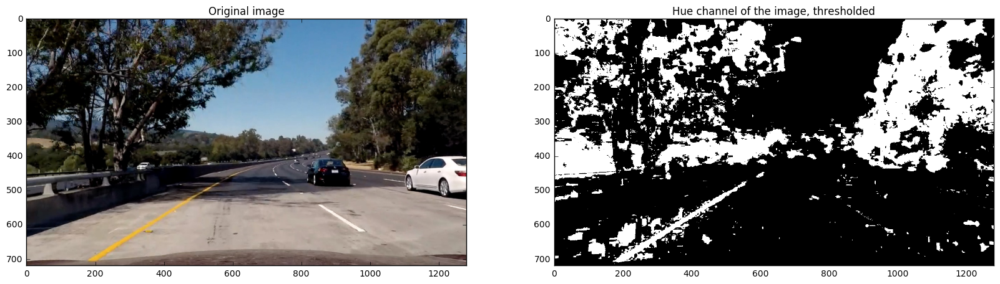

In [694]:
# binary hue
h_th = ch_threshold(hls, 0, thresh=(15,100))

f, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(img)
ax[0].set_title('Original image')
ax[1].imshow(h_th, cmap='gray')  
ax[1].set_title('Hue channel of the image, thresholded')

Union of Saturation and Hue channels

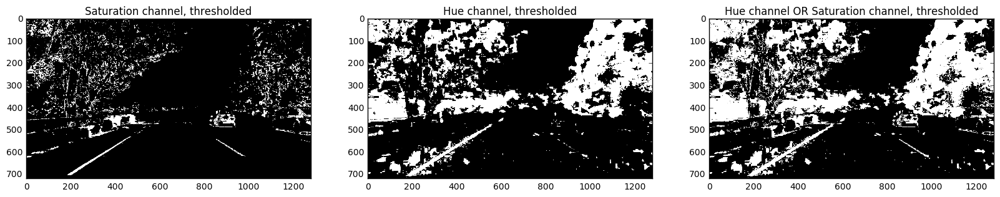

In [695]:
s_or_h = binary_or(h_th,s_th)
f,ax = plt.subplots(1,3,figsize=(20,10))
ax[0].imshow(s_th,cmap='gray')
ax[0].set_title('Saturation channel, thresholded')
ax[1].imshow(h_th,cmap='gray')
ax[1].set_title('Hue channel, thresholded')
ax[2].imshow(s_or_h,cmap='gray')
ax[2].set_title('Hue channel OR Saturation channel, thresholded')

Union of applied Soebel operator in X direction and Saturation channel.

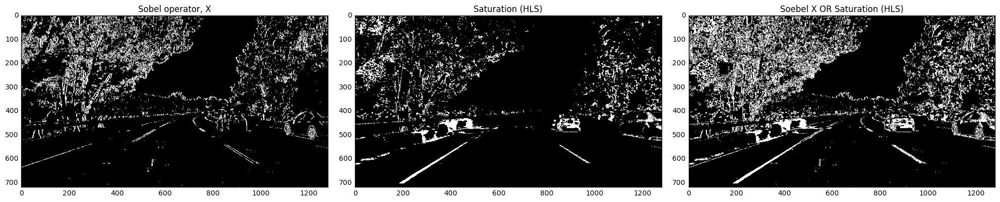

In [696]:
s_sx = binary_or(sxbinary, s_th)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
f.tight_layout()
ax1.imshow(sxbinary, cmap='gray')
ax1.set_title('Sobel operator, X')
ax2.imshow(s_th, cmap='gray')
ax2.set_title('Saturation (HLS)')
ax3.imshow(s_sx, cmap='gray')
ax3.set_title('Soebel X OR Saturation (HLS)')

### HueSaturationValue representation of the RGB image

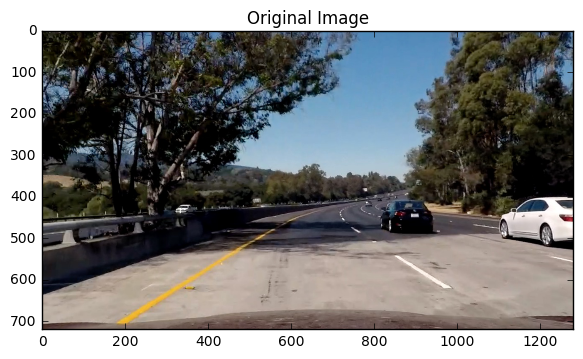

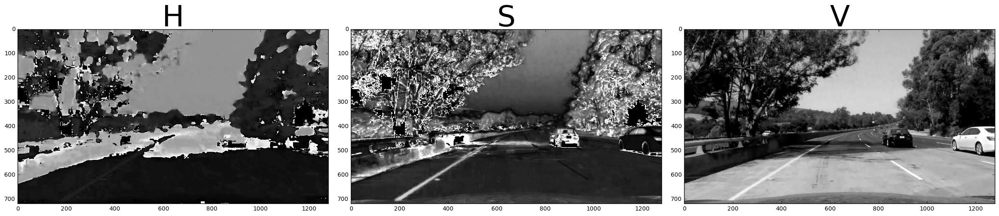

In [697]:
hsv = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
H_hsv = hsv[:,:,0]
S_hsv = hsv[:,:,1]
V_hsv = hsv[:,:,2]

f, (ax1) = plt.subplots(1,1)
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image')
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H_hsv, cmap='gray')
ax1.set_title('H', fontsize=50)
ax2.imshow(S_hsv, cmap='gray')
ax2.set_title('S', fontsize=50)
ax3.imshow(V_hsv, cmap='gray')
ax3.set_title('V', fontsize=50)

### Perspective transformation of the binary image

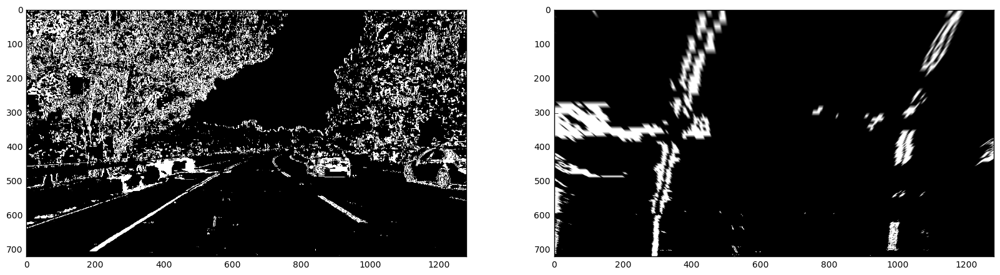

In [698]:
lines_persp = warp(s_sx)
show_2gr(s_sx,lines_persp)

Calculating histogram on warped image

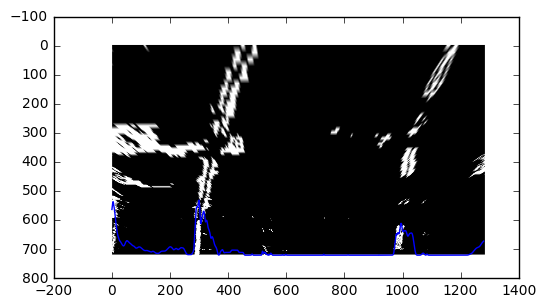

In [702]:
histogram = hist(lines_persp)
plt.imshow(lines_persp,cmap='gray')
plt.plot(img.shape[0]-histogram)

In [703]:
def first_lines(lines_persp, debug=0):
    """
    Function takes warped image and find the lane lines using 
    histogram and sliding window. Returns coef-s of left's and 
    right's lines second order polynoms 
    """
    histogram = hist(lines_persp)
    mid_point = int(len(histogram)/2)
    left = int(np.argmax(histogram[:mid_point]))
    right = int(np.argmax(histogram[mid_point:])) + mid_point
 
    h = lines_persp.shape[0]
    w = lines_persp.shape[1]
    margin = 80
    num_wind = 9
    height = int(lines_persp.shape[0] / num_wind)

    left_line = [[],[]]
    right_line = [[],[]]

    for window in range(num_wind):

        y_low = h-(window+1)*height
        y_high = h-window*height

        left_x_low = left-margin
        left_x_high = left+margin

        right_x_low = right-margin
        right_x_high = right+margin
        
        left_box = np.nonzero(lines_persp[y_low:y_high, left_x_low:left_x_high])
        left_box_y = np.array(left_box[0])+y_low
        left_box_x = np.array(left_box[1])+left_x_low

        left_line[0].append(left_box_x)
        left_line[1].append(left_box_y)

        right_box = np.nonzero(lines_persp[y_low:y_high, right_x_low:right_x_high])
        right_box_y = np.array(right_box[0])+y_low
        right_box_x = np.array(right_box[1])+right_x_low

        right_line[0].append(right_box_x)
        right_line[1].append(right_box_y)

        if len(left_box[1])>50:
            left = left_x_low+int(np.mean(left_box[1]))
        if len(right_box[1])>50:
            right = right_x_low+int(np.mean(right_box[1]))
    left_line[0] = np.concatenate(left_line[0])
    left_line[1] = np.concatenate(left_line[1])
    right_line[0] = np.concatenate(right_line[0])
    right_line[1] = np.concatenate(right_line[1])
    
    # Debugger function to highlight the points asigned to lane line
    if debug == 1:
        plt.plot(left_line[0],left_line[1],'.',color='brown')
        plt.plot(right_line[0],right_line[1],'.',color='brown')

    # polyfit
    # if there are left/right lane lines points, calculate and return
    # polynoms coef-s, else return None
    if (len(left_line[1]>0)&len(right_line[1])>0):
        left_fit=np.polyfit(left_line[1],left_line[0],2)
        right_fit=np.polyfit(right_line[1],right_line[0],2)
        return left_fit, right_fit
    else:
        return None, None

In [704]:
def get_line(lines_persp, fit):
    """
    Function gets warped binary image and polynom's coef-s of one line
    and returns 1 channel image with the line
    """
    binary_l = np.zeros_like(lines_persp)

    ploty = np.linspace(0, lines_persp.shape[0]-1, lines_persp.shape[0])
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]

    line_points = np.column_stack((plotx,ploty))
    line = cv2.polylines(binary_l, np.int32([line_points]),color=255,isClosed=0,thickness=20)

    return line

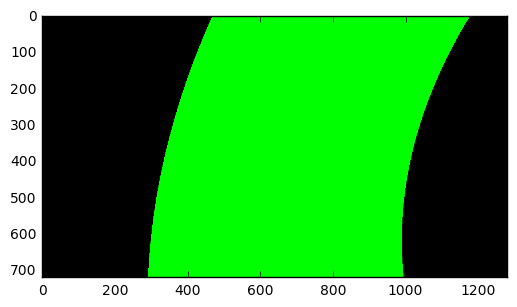

In [616]:
def fill_lane(lines_persp):
    """
    Alternative function to get_line. This function takes binary warped image,
    calls first_lines for polynoms coef-s and returns the filled polygon between
    2 lane lines
    """
    left_fit, right_fit = first_lines(lines_persp)
    if (left_fit != None and right_fit != None):
        binary_l = np.zeros_like(lines_persp)

        ploty = np.linspace(0, lines_persp.shape[0]-1, lines_persp.shape[0])
        plotx_l = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        plotx_r = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        line_points_l = np.column_stack((plotx_l,ploty))
        line_points_r = np.column_stack((plotx_r,ploty))
        line_points = np.concatenate((line_points_l,line_points_r[::-1],line_points_l[:1]))

        cv2.fillPoly(binary_l, np.int32([line_points]),color=255)

        result = np.dstack((np.zeros_like(lines_persp),binary_l,np.zeros_like(lines_persp))).astype('uint8')

        return result
    else:
        zero = np.zeros_like(lines_persp)
        return np.dstack((zero,zero,zero)).astype('uint8')

poly = fill_lane(lines_persp)
plt.imshow(poly, cmap='gray')

In [705]:
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    Function takes 2 images as well as coef-s and adds second 
    image on the first one. Returns result image    
    initial_img * α + img * β + λ
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

In [541]:
def draw_lines(lines_persp, left_fit, right_fit):
    """
    Support function to plot lines on the warped image. Is not used for 
    production
    """
    ploty = np.linspace(0, lines_persp.shape[0]-1, lines_persp.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    plt.imshow(lines_persp,cmap='gray')
    plt.plot(left_fitx, ploty, color=(0,1,0),linewidth=10)
    plt.plot(right_fitx, ploty, color=(0,0,1),linewidth=10)
    plt.xlim(0, lines_persp.shape[1])
    plt.ylim(lines_persp.shape[0], 0)
    histogram = hist(lines_persp)
    mid_point = int(len(histogram)/2)
    left = int(np.argmax(histogram[:mid_point]))
    right = int(np.argmax(histogram[mid_point:])) + mid_point
    plt.plot(lines_persp.shape[0]-histogram, linewidth=1, color = 'green')
    plt.plot(left, lines_persp.shape[0]-10, '*', color = 'yellow')
    plt.plot(right, lines_persp.shape[0]-10, '*', color = 'yellow')

Below I'm exploring the pipeline of lane lines detection and ploting on the given image. On the next step the pipeline will be transformed into function

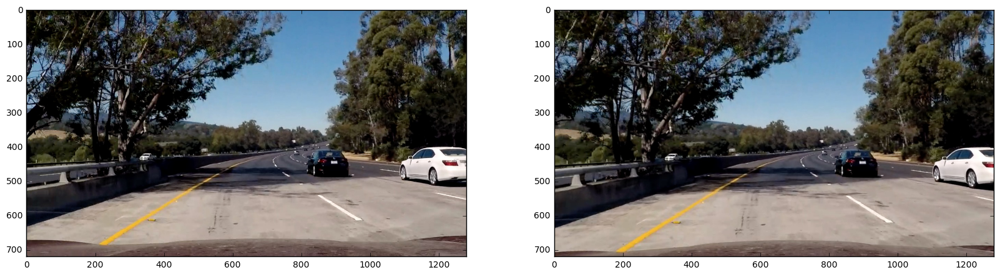

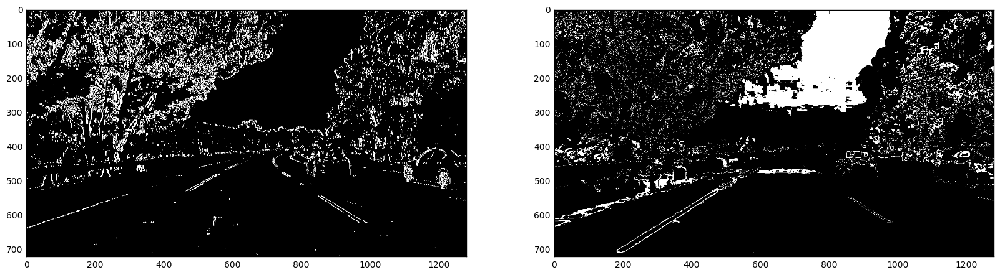

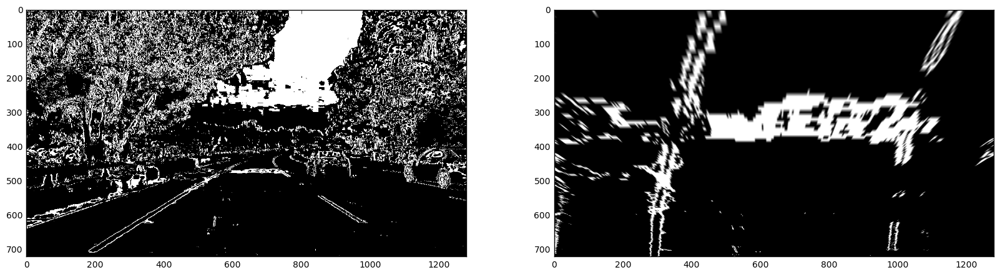

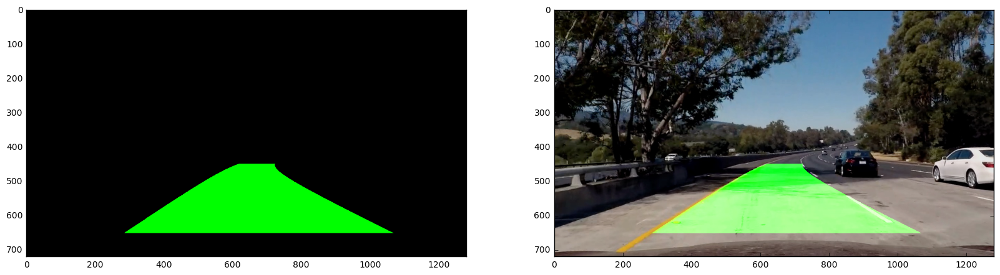

In [706]:
#0: load image
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/test5.jpg'
img_bgr = cv2.imread(fname)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

#1: Distortion Correction
dst = undist(img)

show_2gr(img,dst)

#2: Get binary image
sxbinary = abs_sobel_thresh(dst, orient='x', thresh_min=20, thresh_max=100)
hls = cv2.cvtColor(dst, cv2.COLOR_RGB2HLS)
s_th = ch_threshold(hls, 2, thresh=(100,150))
s_sx = binary_or(sxbinary, s_th)

show_2gr(sxbinary, s_th)

#3: Warp binary image
lines_persp = warp(s_sx)
show_2gr(s_sx,lines_persp)
#draw_lines(lines_persp,left_fit, right_fit)

#4: Find lines polynoms
left_fit, right_fit = first_lines(lines_persp)

#5: Create warped image with lines
left_right_lines=fill_lane(lines_persp)

#6: Unwarped lines image
lines_unwarp = unwarp(left_right_lines)

#7: Merge initial image with unwarped lines image
img_lines = weighted_img(dst, lines_unwarp, α=1, β=0.9, λ=0.)

show_2gr(lines_unwarp,img_lines)

In [707]:
def pipeline(img):
    """
    Function takes an RGB image, applied distortion correction, 
    detects lane lines, draws polygon between lines, add it on
    the initial image and returns the resulted image    
    """
    #1: Distortion Correction
    dst = undist(img)

    #2: Get binary image
    sxbinary = abs_sobel_thresh(dst, orient='x', thresh_min=20, thresh_max=100)
    hls = cv2.cvtColor(dst, cv2.COLOR_RGB2HLS)
    s_th = ch_threshold(hls, 2, thresh=(170,255))
    s_sx = binary_or(sxbinary, s_th)

    #3: Warp binary image
    lines_persp = warp(s_sx)
   
    #4: Find lines polynoms
    left_fit, right_fit = first_lines(lines_persp)

    #5: Create warped image with lines
    left_right_lines=fill_lane(lines_persp)
    
    #6: Unwarped lines image
    lines_unwarp = unwarp(left_right_lines)

    #7: Merge initial image with unwarped lines image
    img_lines = weighted_img(dst, lines_unwarp, α=0.5, β=1, λ=0.)

    return img_lines

### Lane lines detection on tested images
Below I'm detecting lane lines on the test images, provided by Udacity

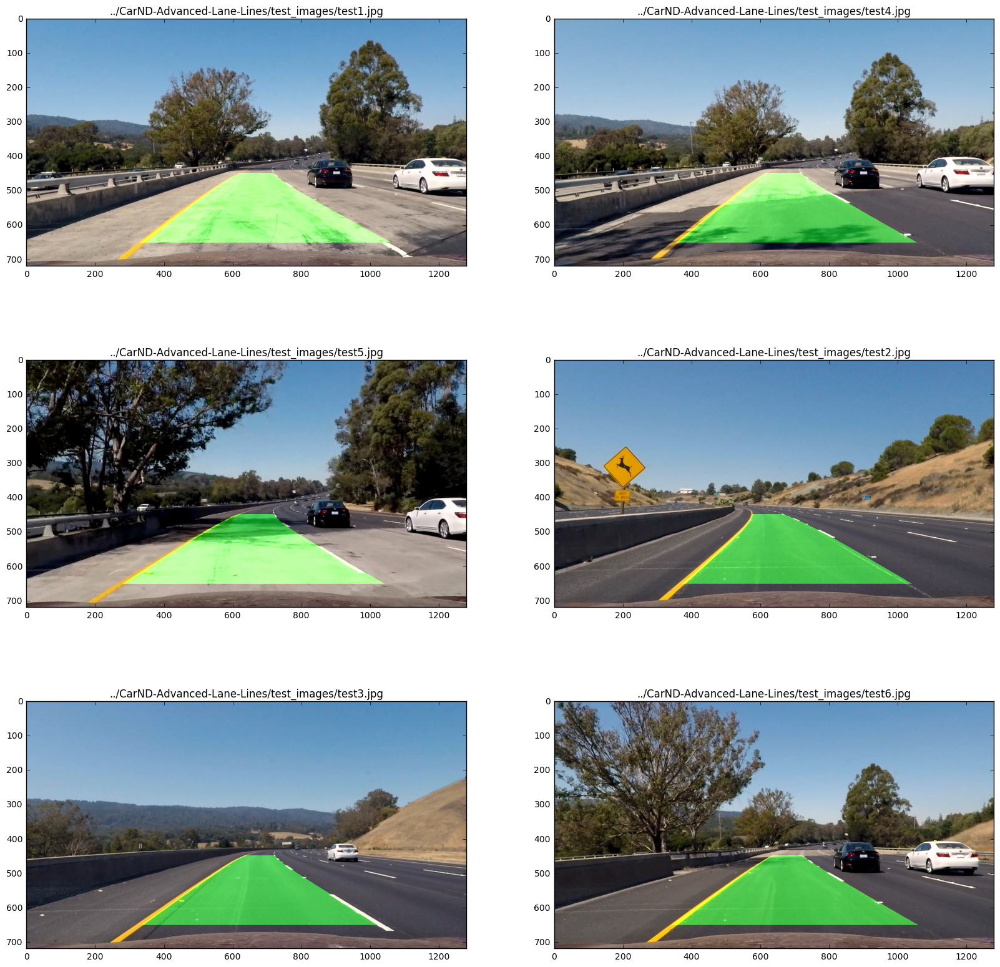

In [641]:
url = '../CarND-Advanced-Lane-Lines/test_images/'
name = 'test*.jpg'

f, ax = plt.subplots(3,2, figsize=(20,20))

images = glob.glob(url+name)
for i,fname in enumerate(images):
    img_bgr = cv2.imread(fname)
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_lines = pipeline(img)
    ax[i%3,i%2].imshow(img_lines)
    ax[i%3,i%2].set_title(fname)

On the next step I'm applying my lane lines detection algorithm to 3 videos, provided by Udacity. Outcome videos are saved on a local disk and will be loaded to GitHub repository.

In [642]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

from moviepy.editor import VideoFileClip
clip1= VideoFileClip("../CarND-Advanced-Lane-Lines/project_video.mp4")

white_output = 'project_video_out.mp4'

white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4




  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:00<04:00,  5.24it/s]

  0%|          | 2/1261 [00:00<03:57,  5.31it/s]

  0%|          | 3/1261 [00:00<03:56,  5.31it/s]

  0%|          | 4/1261 [00:00<03:57,  5.29it/s]

  0%|          | 5/1261 [00:00<03:56,  5.31it/s]

  0%|          | 6/1261 [00:01<03:52,  5.40it/s]

  1%|          | 7/1261 [00:01<03:50,  5.43it/s]

  1%|          | 8/1261 [00:01<03:49,  5.45it/s]

  1%|          | 9/1261 [00:01<03:54,  5.35it/s]

  1%|          | 10/1261 [00:01<03:56,  5.30it/s]

  1%|          | 11/1261 [00:02<03:56,  5.29it/s]

  1%|          | 12/1261 [00:02<03:53,  5.34it/s]

  1%|          | 13/1261 [00:02<03:51,  5.38it/s]

  1%|          | 14/1261 [00:02<03:52,  5.36it/s]

  1%|          | 15/1261 [00:02<03:40,  5.65it/s]

  1%|▏         | 16/1261 [00:02<04:00,  5.18it/s]

  1%|▏         | 17/1261 [00:03<04:11,  4.95it/s]

  1%|▏         | 18/1261 [00:03<04:06,  5.04it/s]

  2%|▏         | 19/1261 [00:03<04:13,  4.91it/

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 7min 13s, sys: 1min 2s, total: 8min 16s
Wall time: 4min 40s


In [643]:
clip2= VideoFileClip("../CarND-Advanced-Lane-Lines/harder_challenge_video.mp4")

white_output = 'harder_challenge_out.mp4'

white_clip = clip2.fl_image(pipeline)
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_out.mp4
[MoviePy] Writing video harder_challenge_out.mp4




  0%|          | 0/1200 [00:00<?, ?it/s]

  0%|          | 1/1200 [00:00<04:00,  4.98it/s]

  0%|          | 2/1200 [00:00<04:03,  4.92it/s]

  0%|          | 3/1200 [00:00<04:01,  4.95it/s]

  0%|          | 4/1200 [00:00<04:03,  4.91it/s]

  0%|          | 5/1200 [00:01<04:01,  4.96it/s]

  0%|          | 6/1200 [00:01<03:59,  4.99it/s]

  1%|          | 7/1200 [00:01<04:07,  4.81it/s]

  1%|          | 8/1200 [00:01<04:10,  4.77it/s]

  1%|          | 9/1200 [00:01<04:04,  4.87it/s]

  1%|          | 10/1200 [00:02<04:04,  4.86it/s]

  1%|          | 11/1200 [00:02<04:09,  4.77it/s]

  1%|          | 12/1200 [00:02<04:01,  4.93it/s]

  1%|          | 13/1200 [00:02<03:57,  4.99it/s]

  1%|          | 14/1200 [00:02<03:55,  5.03it/s]

  1%|▏         | 15/1200 [00:03<03:56,  5.01it/s]

  1%|▏         | 16/1200 [00:03<03:54,  5.04it/s]

  1%|▏         | 17/1200 [00:03<03:55,  5.03it/s]

  2%|▏         | 18/1200 [00:03<03:52,  5.07it/s]

  2%|▏         | 19/1200 [00:03<03:50,  5.11it/

[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_out.mp4 

CPU times: user 7min 12s, sys: 1min 2s, total: 8min 14s
Wall time: 4min 53s


In [644]:
clip3= VideoFileClip("../CarND-Advanced-Lane-Lines/challenge_video.mp4")

white_output = 'challenge_out.mp4'

white_clip = clip3.fl_image(pipeline)
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video challenge_out.mp4
[MoviePy] Writing video challenge_out.mp4




  0%|          | 0/485 [00:00<?, ?it/s]

  0%|          | 1/485 [00:00<01:31,  5.26it/s]

  0%|          | 2/485 [00:00<01:31,  5.28it/s]

  1%|          | 3/485 [00:00<01:27,  5.53it/s]

  1%|          | 4/485 [00:00<01:25,  5.60it/s]

  1%|          | 5/485 [00:00<01:23,  5.74it/s]

  1%|          | 6/485 [00:01<01:21,  5.85it/s]

  1%|▏         | 7/485 [00:01<01:21,  5.89it/s]

  2%|▏         | 8/485 [00:01<01:19,  6.03it/s]

  2%|▏         | 9/485 [00:01<01:19,  5.97it/s]

  2%|▏         | 10/485 [00:01<01:20,  5.87it/s]

  2%|▏         | 11/485 [00:01<01:20,  5.87it/s]

  2%|▏         | 12/485 [00:02<01:20,  5.89it/s]

  3%|▎         | 13/485 [00:02<01:19,  5.92it/s]

  3%|▎         | 14/485 [00:02<01:20,  5.86it/s]

  3%|▎         | 15/485 [00:02<01:20,  5.83it/s]

  3%|▎         | 16/485 [00:02<01:21,  5.78it/s]

  4%|▎         | 17/485 [00:02<01:20,  5.83it/s]

  4%|▎         | 18/485 [00:03<01:18,  5.98it/s]

  4%|▍         | 19/485 [00:03<01:17,  5.99it/s]

  4%|▍         |

[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_out.mp4 

CPU times: user 2min 38s, sys: 17.2 s, total: 2min 56s
Wall time: 1min 33s


## Outcomes
In the current version of the project I'm applying basic steps in order to detect lane lines on the provided images and videos.  
  
Current implementation is not robust and require improvements in image preprocessing (finding the best combination of thresholded gradient and color scheme binary images) as well as optimization of lines detection.
  
Now I'm searching the lane lines from scratch on each image. Tracking the lines shoould improve robustness of the model and most importantly imrpove the performance of the model.
  
I've mentioned that it takes significant amount of time to process the video which couldn't work in real implementation. After I get the appropriate level of lines detection, I'm going to investigate time consumption on each preprocessing step in order to find the ways to decrease the time of video (or stream) processing.